In [2]:
import torch
from Loader_17 import DAVIS_Rawset, DAVIS_Infer, DAVIS_Dataset, normalize
from polygon import RasLoss
from tqdm import tqdm
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import numpy as np
from copy import copy
import matplotlib.pyplot as plt
from einops import rearrange

In [3]:
train_rawset = DAVIS_Rawset(is_train=True)
val_rawset = DAVIS_Rawset(is_train=False)

In [4]:
len(train_rawset.data_set)

144

In [5]:
video_index = 0
tmp_rawset = copy(train_rawset)
tmp_rawset.data_set = tmp_rawset.data_set[video_index:video_index+1]
len(tmp_rawset.data_set)

1

In [6]:
tmp_dataset = DAVIS_Dataset(tmp_rawset)
tmp_infer = DAVIS_Infer(tmp_rawset)

In [7]:
tmp_loader = DataLoader(tmp_dataset, batch_size=4, shuffle=True)

In [8]:
len(tmp_loader)

21

In [9]:
(
    video_idx,
    frame_idx,
    fir_img,
    fir_sgm,
    pre_img,
    pre_sgm,
    cur_img,
    cur_sgm,
) = next(iter(tmp_loader))
fir_img.shape, fir_sgm.shape, frame_idx

(torch.Size([4, 3, 224, 224]),
 torch.Size([4, 224, 224]),
 tensor([ 4, 65, 25,  9]))

(-0.5, 223.5, 223.5, -0.5)

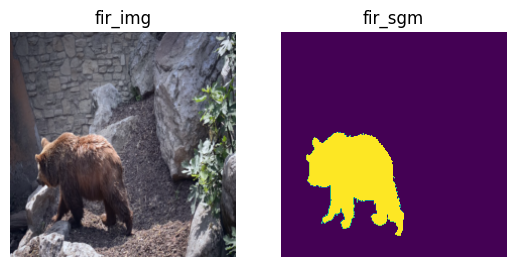

In [10]:
index = 0
plt.subplot(1, 2, 1)
plt.imshow(normalize(fir_img[index].permute(1, 2, 0)))
plt.title("fir_img")
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(fir_sgm[index])
plt.title("fir_sgm")
# turn off axis
plt.axis("off")

In [11]:
fir_sgm.shape

torch.Size([4, 224, 224])

In [12]:
indices = torch.nonzero(fir_sgm)
indices, indices.shape

(tensor([[  0, 100,  55],
         [  0, 100,  56],
         [  0, 100,  58],
         ...,
         [  3, 202, 116],
         [  3, 202, 117],
         [  3, 202, 118]]),
 torch.Size([24096, 3]))

In [13]:
indices[indices[:, 0] == 0].shape[0] + indices[indices[:, 0] == 1].shape[0] + indices[indices[:, 0] == 2].shape[0] + indices[indices[:, 0] == 3].shape[0]

24096

In [14]:
fir_batch_indices = indices[indices[:, 0] == 0][:, 1:]
fir_batch_indices

tensor([[100,  55],
        [100,  56],
        [100,  58],
        ...,
        [202, 116],
        [202, 117],
        [202, 118]])

In [15]:
fir_batch_indices[:, 1]

tensor([ 55,  56,  58,  ..., 116, 117, 118])

In [16]:
def get_extrame_4_points(batch_indices: torch.Tensor):
    if batch_indices.shape[0] == 0:
        mid = 224 // 2
        return torch.tensor([[mid, mid], [mid, mid], [mid, mid], [mid, mid]])
    x_min = batch_indices[:, 1].min()
    x_max = batch_indices[:, 1].max()
    y_min = batch_indices[:, 0].min()
    y_max = batch_indices[:, 0].max()
    return torch.tensor([[x_min, y_min], [x_min, y_max], [x_max, y_max], [x_max, y_min]])
get_extrame_4_points(fir_batch_indices)

tensor([[ 25, 100],
        [ 25, 202],
        [121, 202],
        [121, 100]])

In [17]:
def get_bounding_box(sgm: torch.Tensor):
    indices = torch.nonzero(sgm)
    batch_size = sgm.shape[0]
    bounding_boxes = []
    for i in range(batch_size):
        batch_indices = indices[indices[:, 0] == i][:, 1:]
        bounding_boxes.append(get_extrame_4_points(batch_indices))
    return torch.stack(bounding_boxes)
get_bounding_box(fir_sgm).shape

torch.Size([4, 4, 2])

In [18]:
fir_sgm[index].nonzero()

tensor([[100,  55],
        [100,  56],
        [100,  58],
        ...,
        [202, 116],
        [202, 117],
        [202, 118]])

In [19]:
bounding_box = get_bounding_box(fir_sgm)
bounding_box.shape

torch.Size([4, 4, 2])

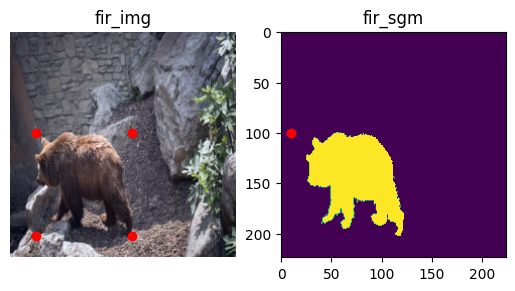

In [20]:
index = 0
plt.subplot(1, 2, 1)
plt.imshow(normalize(fir_img[index].permute(1, 2, 0)))
plt.title("fir_img")
plt.axis("off")
# plot bounding box
bounding_box = get_bounding_box(fir_sgm)
for i in range(4):
    plt.scatter(bounding_box[index][i][0], bounding_box[index][i][1], c="r")
plt.subplot(1, 2, 2)
plt.imshow(fir_sgm[index])
plt.title("fir_sgm")
# turn off axis
# plt.axis("off")
plt.scatter([10], [100], c="r")

In [21]:
fir_sgm[index]

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])

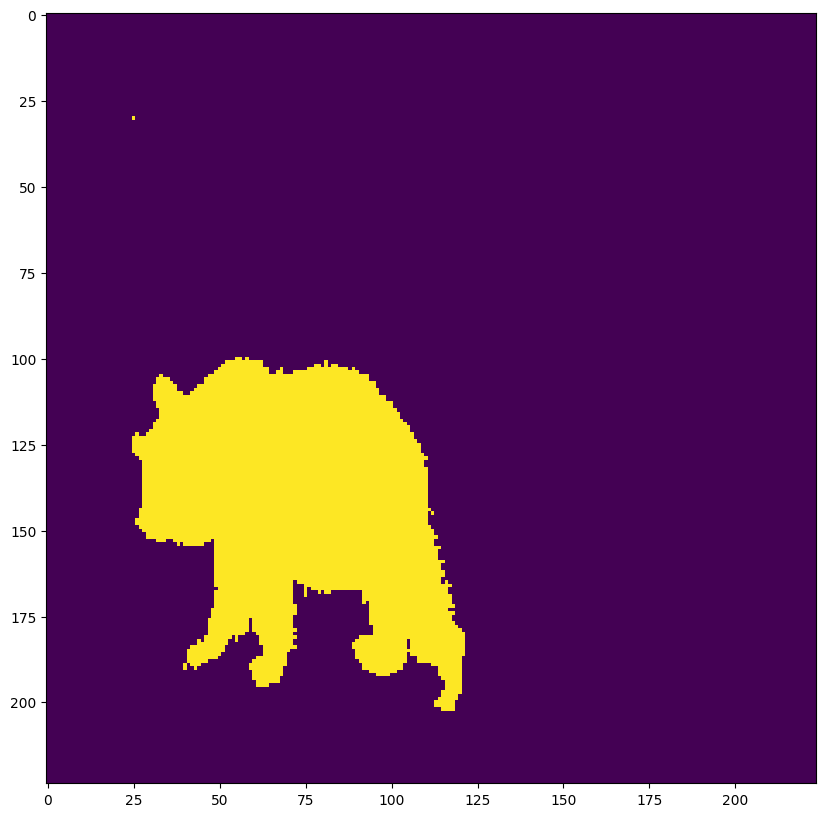

In [22]:
fir_sgm[index][30, 25] = 1
plt.figure(figsize=(10, 10))
plt.imshow(fir_sgm[index])

In [23]:
fir_img.shape

torch.Size([4, 3, 224, 224])

In [24]:
fir_img[index][:, 25, 30] = torch.tensor([1, 1, 1])

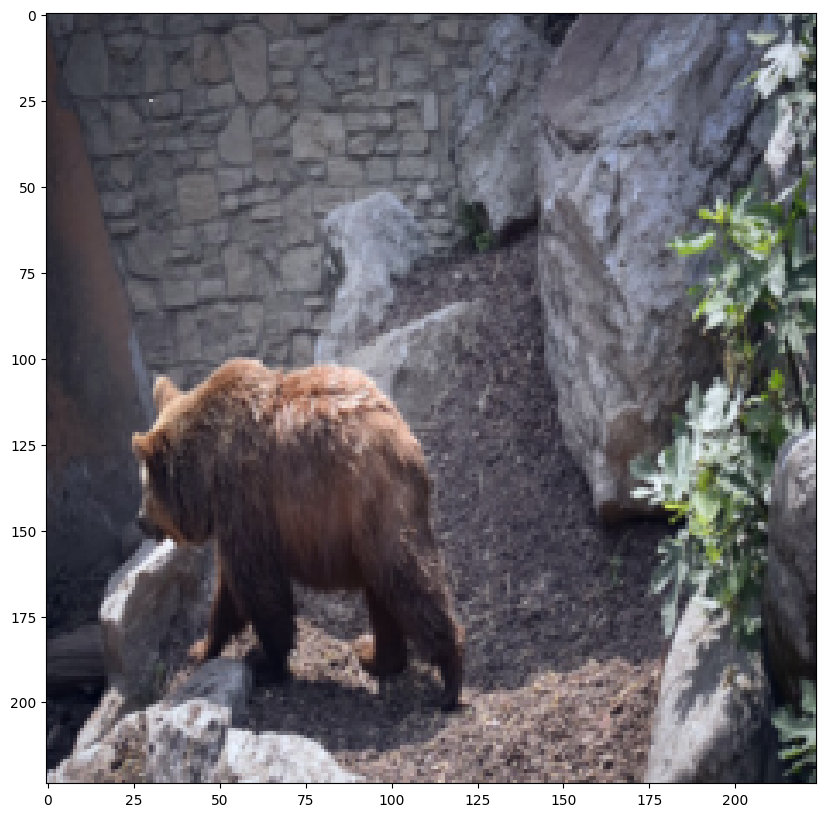

In [25]:
plt.figure(figsize=(10, 10))
plt.imshow(normalize(fir_img[index].permute(1, 2, 0)))

In [26]:
# this function is WRONG
def get_bou_feats_v0(img_feats: torch.Tensor, boundary: torch.Tensor) -> torch.Tensor:
    bou_features = img_feats[0, :, boundary[0, :, 0], boundary[0, :, 1]].unsqueeze(0)
    for i in range(1, boundary.shape[0]):
        bou_features = torch.cat(
            (
                bou_features,
                img_feats[
                    i,
                    :,
                    boundary[i, :, 0],
                    boundary[i, :, 1],
                ].unsqueeze(0),
            ),
            dim=0,
        )
    return bou_features.permute(0, 2, 1)
# get the boundary features
# this function is CORRECT
def get_bou_feats(img_feats: torch.Tensor, boundary: torch.Tensor) -> torch.Tensor:
    return img_feats[
        torch.arange(boundary.shape[0]).unsqueeze(1),
        :,
        boundary[:, :, 1],
        boundary[:, :, 0],
    ]

In [27]:
fir_bou = torch.tensor([[0, 10], [30, 25], [25, 30], [10, 10], [0, 0]]).expand(4, 5, 2)
fir_bou.shape

torch.Size([4, 5, 2])

In [28]:
fir_feats = get_bou_feats_v0(fir_img, fir_bou)
fir_feats[index]

tensor([[-1.0219, -1.0378, -0.9504],
        [-0.5938, -0.5651, -0.4450],
        [ 1.0000,  1.0000,  1.0000],
        [-0.9877, -0.9678, -0.8284],
        [-1.1418, -1.1253, -0.9504]])

In [29]:
fir_feats = get_bou_feats(fir_img, fir_bou)
fir_feats[index]

tensor([[-0.9705, -1.2479, -1.2119],
        [ 1.0000,  1.0000,  1.0000],
        [-0.5938, -0.5651, -0.4450],
        [-0.9877, -0.9678, -0.8284],
        [-1.1418, -1.1253, -0.9504]])

In [30]:
fir_feats.shape, fir_feats[index].shape

(torch.Size([4, 5, 3]), torch.Size([5, 3]))

In [31]:
fir_bounding_box = get_bounding_box(fir_sgm)
fir_bounding_box.shape

torch.Size([4, 4, 2])

In [32]:
for i in range(4):
    fir_img[index][
        :,
        fir_bounding_box[index][i][1],
        fir_bounding_box[index][i][0],
    ] = torch.tensor([2, 1, 2])

In [33]:
fir_img.max()

tensor(2.2740)

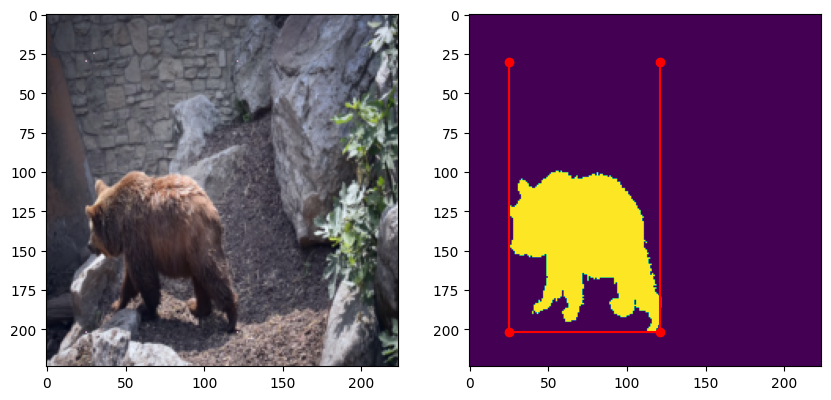

In [34]:
fir_bounding_box = get_bounding_box(fir_sgm)
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(normalize(fir_img[index].permute(1, 2, 0)))
plt.subplot(1, 2, 2)
plt.imshow(fir_sgm[index])
for i in range(4):
    plt.scatter(
        fir_bounding_box[index][i][0].item(),
        fir_bounding_box[index][i][1].item(),
        c="r",
    )
plt.plot(fir_bounding_box[index][:,0].cpu().detach().numpy(), fir_bounding_box[index][:,1].cpu().detach().numpy(), c='r')


In [35]:
get_bou_feats(fir_img, fir_bounding_box)

tensor([[[ 2.0000,  1.0000,  2.0000],
         [ 2.0000,  1.0000,  2.0000],
         [ 2.0000,  1.0000,  2.0000],
         [ 2.0000,  1.0000,  2.0000]],

        [[-0.4054, -0.3550, -0.0615],
         [-0.9020, -0.9503, -0.7936],
         [-0.4911, -0.6702, -0.6018],
         [-0.9192, -1.0028, -0.8110]],

        [[-0.4054, -0.3550, -0.0615],
         [-0.9020, -0.9503, -0.7936],
         [-0.4911, -0.6702, -0.6018],
         [-0.9192, -1.0028, -0.8110]],

        [[-0.4054, -0.3550, -0.0615],
         [-0.9020, -0.9503, -0.7936],
         [-0.4911, -0.6702, -0.6018],
         [-0.9192, -1.0028, -0.8110]]])

tensor([[[ 25, 100],
         [ 25, 198],
         [115, 198],
         [115, 100]],

        [[ 29,  83],
         [ 29, 189],
         [114, 189],
         [114,  83]],

        [[ 29, 102],
         [ 29, 198],
         [124, 198],
         [124, 102]],

        [[ 26,  98],
         [ 26, 195],
         [111, 195],
         [111,  98]]], device='cuda:0')


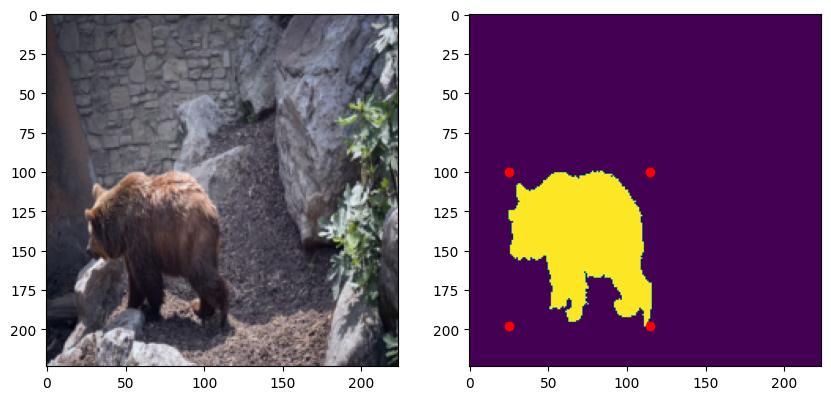

In [36]:
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(normalize(pre_img[index].permute(1, 2, 0)))
plt.subplot(1, 2, 2)
plt.imshow(pre_sgm[index])
pre_bound_box = get_bounding_box(pre_sgm.cuda()).cuda()
print(pre_bound_box)
for i in range(4):
    plt.scatter(
        pre_bound_box[index][i][0].item(),
        pre_bound_box[index][i][1].item(),
        c="r",
    )

In [37]:
class PositionalEncoding(nn.Module):
    def __init__(self, embed_dim: int, dropout=0.1, max_seq_len=1024) -> None:
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_seq_len, embed_dim)
        position = torch.arange(0, max_seq_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(
            torch.arange(0, embed_dim, 2).float() * (-np.log(10000.0) / embed_dim)
        )
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)
        self.register_buffer("pe", pe)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = x + self.pe[:, : x.size(1)]
        return self.dropout(x)


def get_img_tokens(img_features: torch.Tensor) -> torch.Tensor:
    img_tokens = rearrange(
        img_features,
        "b c h w -> b (h w) c",
    )
    return img_tokens


class IterBaseModel(nn.Module):
    def __init__(
        self, layer_num=1, head_num=1, offset_limit=56, freeze_backbon=True
    ) -> None:
        super(IterBaseModel, self).__init__()
        self.offset_limit = offset_limit
        self.featup = torch.hub.load(
            "mhamilton723/FeatUp",
            "dino16",
            use_norm=True,
        )
        self.img_encoder = self.featup.model
        # freeze backbone
        if freeze_backbon:
            for param in self.featup.parameters():
                param.requires_grad = False
        d_img = 384
        d_token = d_img + 2
        self.img_token_fc = nn.Sequential(
            nn.Linear(d_img, d_token),
        )
        self.cur_img_fc = nn.Sequential(
            nn.Linear(d_img, d_token),
        )
        self.layer_norm = nn.LayerNorm(d_token)
        self.pos_enc = PositionalEncoding(d_token)
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_token,
            nhead=head_num,
            batch_first=True,
        )
        self.transformer_encoder = nn.TransformerEncoder(
            encoder_layer,
            num_layers=layer_num,
        )
        decoder_layer = nn.TransformerDecoderLayer(
            d_model=d_token,
            nhead=head_num,
            batch_first=True,
        )
        self.transformer_decoder = nn.TransformerDecoder(
            decoder_layer,
            num_layers=layer_num,
        )
        self.xy_offset_fc = nn.Sequential(
            nn.Linear(d_token, 2),
        )

    def forward(
        self,
        fir_img: torch.Tensor,
        fir_sgm: torch.Tensor,
        pre_img: torch.Tensor,
        pre_sgm: torch.Tensor,
        cur_img: torch.Tensor,
    ) -> torch.Tensor:
        fir_sgm = fir_sgm.unsqueeze(1)
        pre_sgm = pre_sgm.unsqueeze(1)
        fir_img = fir_img * fir_sgm
        pre_img = pre_img * pre_sgm
        fir_img_feats = self.img_encoder(fir_img)
        pre_img_feats = self.img_encoder(pre_img)
        cur_img_feats = self.img_encoder(cur_img)
        fir_img_tokens = get_img_tokens(fir_img_feats)
        pre_img_tokens = get_img_tokens(pre_img_feats)
        cur_img_tokens = get_img_tokens(cur_img_feats)
        mem_img_tokens = torch.cat(
            (fir_img_tokens, pre_img_tokens),
            dim=1,
        )
        mem_img_tokens = self.img_token_fc(mem_img_tokens)
        cur_img_tokens = self.cur_img_fc(cur_img_tokens)
        img_tokens = torch.cat(
            (mem_img_tokens, cur_img_tokens),
            dim=1,
        )
        img_tokens = self.layer_norm(img_tokens)
        img_tokens = self.pos_enc(img_tokens)
        img_tokens = self.transformer_encoder(img_tokens)

        init_bou = get_bounding_box(pre_sgm.squeeze(1)).cuda()
        cur_img_featup = self.featup(cur_img)
        cur_bou_feat = get_bou_feats(cur_img_featup, init_bou)
        cur_bou_tokens = torch.cat(
            [cur_bou_feat, init_bou.float()],
            dim=-1,
        )
        cur_bou_tokens = self.layer_norm(cur_bou_tokens)
        cur_bou_tokens = self.pos_enc(cur_bou_tokens)
        cur_bou_tokens = self.transformer_decoder(
            cur_bou_tokens,
            img_tokens,
        )
        xy_offset = self.xy_offset_fc(cur_bou_tokens).sigmoid() * self.offset_limit
        result = init_bou + xy_offset
        result = result.clamp(min=0, max=223)
        return result


model = IterBaseModel(6, 2).cuda()
model(
    fir_img.cuda(),
    fir_sgm.cuda(),
    pre_img.cuda(),
    pre_sgm.cuda(),
    cur_img.cuda(),
)

Using cache found in /zhome/32/f/202284/.cache/torch/hub/mhamilton723_FeatUp_main
Using cache found in /zhome/32/f/202284/.cache/torch/hub/facebookresearch_dino_main
/work3/s232248/miniconda3/envs/rass/lib/python3.12/site-packages/torch/functional.py:513: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1720538439764/work/aten/src/ATen/native/TensorShape.cpp:3609.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


tensor([[[ 50.2620, 136.3053],
         [ 50.4389, 223.0000],
         [143.2339, 223.0000],
         [140.4928, 137.5425]],

        [[ 56.0573, 123.0159],
         [ 50.1733, 223.0000],
         [140.9723, 223.0000],
         [141.5339, 122.7283]],

        [[ 53.9812, 141.5736],
         [ 53.8260, 223.0000],
         [149.4033, 223.0000],
         [153.5697, 139.5645]],

        [[ 51.9527, 136.8283],
         [ 53.6712, 223.0000],
         [135.9356, 223.0000],
         [136.6510, 134.7619]]], device='cuda:0', grad_fn=<ClampBackward1>)

In [38]:
model = IterBaseModel(1, 1).cuda()
ras_loss = RasLoss().cuda()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

Using cache found in /zhome/32/f/202284/.cache/torch/hub/mhamilton723_FeatUp_main
Using cache found in /zhome/32/f/202284/.cache/torch/hub/facebookresearch_dino_main
/work3/s232248/miniconda3/envs/rass/lib/python3.12/site-packages/torch/nn/modules/transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.num_heads is odd
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


In [39]:
loss_dict = {}
iou_dict = {}
interval_epochs = 1
interval_steps = 10
epoch_index = 0

In [40]:
for interval in range(interval_steps):
    for e in range(interval_epochs):
        model.train()
        mean_loss = 0
        for(
            video_idx,
            frame_idx,
            fir_img,
            fir_sgm,
            pre_img,
            pre_sgm,
            cur_img,
            cur_sgm,
        ) in tqdm(tmp_loader):
            optimizer.zero_grad()
            pred_bou = model(
                fir_img.cuda(),
                fir_sgm.cuda(),
                pre_img.cuda(),
                pre_sgm.cuda(),
                cur_img.cuda(),
            )
            loss = ras_loss(pred_bou, cur_sgm.cuda())
            loss.backward()
            optimizer.step()
            mean_loss += loss.item()
        mean_loss /= len(tmp_loader)
        loss_dict[epoch_index] = mean_loss
        epoch_index += 1
        print(f"epoch: {epoch_index}, loss: {mean_loss}")
    tmp_infer.infer_model(model)
    iou = tmp_infer.get_total_iou()
    iou_dict[epoch_index] = iou
    print(f"epoch: {epoch_index}, iou: {iou}")

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.78it/s]


epoch: 1, loss: 0.28018070118767874
epoch: 1, iou: 0.14514305567740948


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:02<00:00,  7.21it/s]


epoch: 2, loss: 0.24528148628416516
epoch: 2, iou: 0.10829557546067918


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:02<00:00,  7.21it/s]


epoch: 3, loss: 0.23870797668184554
epoch: 3, iou: 0.15414978841805355


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:02<00:00,  7.21it/s]


epoch: 4, loss: 0.23573245321001327
epoch: 4, iou: 0.12680101283851924


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:02<00:00,  7.21it/s]


epoch: 5, loss: 0.23742755537941343
epoch: 5, iou: 0.18489016370447858


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:02<00:00,  7.21it/s]


epoch: 6, loss: 0.2349158837681725
epoch: 6, iou: 0.11734921709929341


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:02<00:00,  7.22it/s]


epoch: 7, loss: 0.23288318372908093
epoch: 7, iou: 0.08637698924181467


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:02<00:00,  7.21it/s]


epoch: 8, loss: 0.23036741075061618
epoch: 8, iou: 0.08740655063538562


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:02<00:00,  7.18it/s]


epoch: 9, loss: 0.22837096736544654
epoch: 9, iou: 0.09819724544234384


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:02<00:00,  7.21it/s]


epoch: 10, loss: 0.22935021207446143
epoch: 10, iou: 0.12543829640054507


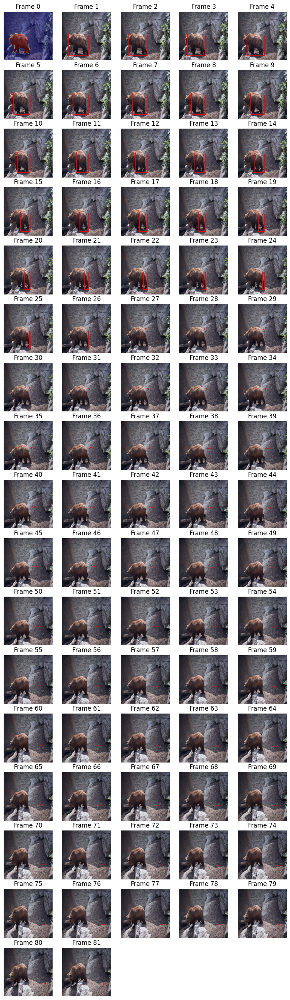

In [41]:
tmp_infer.show_infer_results(0, interval=1)

In [42]:
model.eval()
model.training

False

tensor(0.6127, grad_fn=<DivBackward0>)


Text(0.5, 1.0, 'iou: 0.6127')

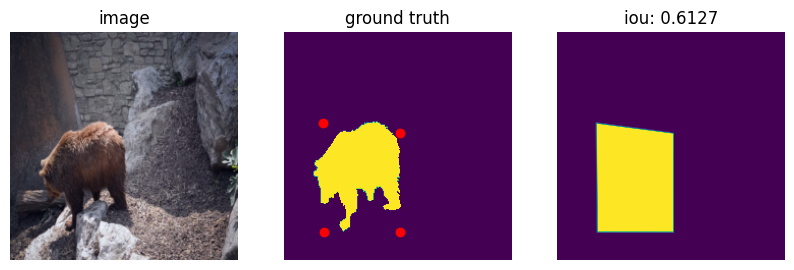

In [43]:
result = model(
    fir_img.cuda(),
    fir_sgm.cuda(),
    pre_img.cuda(),
    pre_sgm.cuda(),
    cur_img.cuda(),
)
predict_sgm = ras_loss.soft_polygon(result, 224, 224)
index = 0
plt.figure(figsize=(10, 10))
plt.subplot(1, 3, 1)
plt.title("image")
plt.axis("off")
plt.imshow(normalize(cur_img[index].permute(1, 2, 0)))
plt.subplot(1, 3, 2)
plt.axis("off")
plt.imshow(cur_sgm[index])
plt.scatter(result[index][:, 0].cpu().detach().numpy(), result[index][:, 1].cpu().detach().numpy(), c="r")
plt.title("ground truth")
plt.subplot(1, 3, 3)
plt.axis("off")
plt.imshow(predict_sgm[index].cpu().detach().numpy())
# calculate iou using the predict_sgm and cur_sgm
iou = predict_sgm.cpu() * cur_sgm.cpu()
iou = iou.sum().cpu() / (predict_sgm.sum().cpu() + cur_sgm.sum().cpu() - iou.sum().cpu())
print(iou)
plt.title(f"iou: {iou:.4f}")

In [44]:
def add_mid_points(points: torch.Tensor) -> torch.Tensor:
    points_shift = torch.roll(points, 1, 1)
    mid_points = (points + points_shift) / 2
    new_points = torch.zeros((points.shape[0], points.shape[1] * 2, 2)).to(points.device)
    new_points[:, ::2] = mid_points
    new_points[:, 1::2] = points
    return new_points


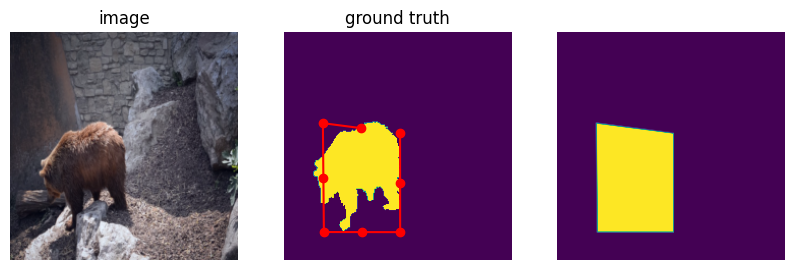

In [45]:
new_result = add_mid_points(result)
plt.figure(figsize=(10, 10))
plt.subplot(1, 3, 1)
plt.title("image")
plt.axis("off")
plt.imshow(normalize(cur_img[index].permute(1, 2, 0)))
plt.subplot(1, 3, 2)
plt.axis("off")
plt.imshow(cur_sgm[index])
plt.scatter(new_result[index][:, 0].cpu().detach().numpy(), new_result[index][:, 1].cpu().detach().numpy(), c="r")
plt.plot(new_result[index][:, 0].cpu().detach().numpy(), new_result[index][:, 1].cpu().detach().numpy(), c="r")
plt.title("ground truth")
plt.subplot(1, 3, 3)
plt.axis("off")
plt.imshow(predict_sgm[index].cpu().detach().numpy())
# calculate iou using the predict_sgm and cur_sgm

In [46]:
class IterUpModel(nn.Module):
    def __init__(
        self,
        up_transform_num=4,
        xy_offset_limit=56,
        freeze_backbon=True,
    ) -> None:
        super(IterUpModel, self).__init__()
        self.offset_limit = xy_offset_limit
        self.featup = torch.hub.load(
            "mhamilton723/FeatUp",
            "dino16",
            use_norm=True,
        )
        self.img_encoder = self.featup.model
        # freeze backbone
        if freeze_backbon:
            for param in self.featup.parameters():
                param.requires_grad = False
        d_img = 384
        d_token = d_img + 2
        self.img_token_fc = nn.Sequential(
            nn.Linear(d_img, d_token),
        )
        self.cur_img_fc = nn.Sequential(
            nn.Linear(d_img, d_token),
        )
        self.layer_norm = nn.LayerNorm(d_token)
        self.pos_enc = PositionalEncoding(d_token)
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_token,
            nhead=1,
            batch_first=True,
        )
        self.transformer_encoder = nn.TransformerEncoder(
            encoder_layer,
            num_layers=1,
        )
        decoder_layer = nn.TransformerDecoderLayer(
            d_model=d_token,
            nhead=1,
            batch_first=True,
        )
        self.transformer_decoder = nn.TransformerDecoder(
            decoder_layer,
            num_layers=1,
        )
        self.xy_offset_fc = nn.Sequential(
            nn.Linear(d_token, 2),
        )
        self.up_transform_num = up_transform_num
        up_decoder_layer = nn.TransformerDecoderLayer(
            d_model=d_token,
            nhead=1,
            batch_first=True,
        )
        self.up_transformer_decoders = nn.ModuleList(
            [
                nn.TransformerDecoder(
                    up_decoder_layer,
                    num_layers=1,
                )
                for _ in range(up_transform_num)
            ]
        )

    def forward(
        self,
        fir_img: torch.Tensor,
        fir_sgm: torch.Tensor,
        pre_img: torch.Tensor,
        pre_sgm: torch.Tensor,
        cur_img: torch.Tensor,
    ) -> torch.Tensor:
        fir_sgm = fir_sgm.unsqueeze(1)
        pre_sgm = pre_sgm.unsqueeze(1)
        fir_img = fir_img * fir_sgm
        pre_img = pre_img * pre_sgm
        fir_img_feats = self.img_encoder(fir_img)
        pre_img_feats = self.img_encoder(pre_img)
        cur_img_feats = self.img_encoder(cur_img)
        fir_img_tokens = get_img_tokens(fir_img_feats)
        pre_img_tokens = get_img_tokens(pre_img_feats)
        cur_img_tokens = get_img_tokens(cur_img_feats)
        mem_img_tokens = torch.cat(
            (fir_img_tokens, pre_img_tokens),
            dim=1,
        )
        mem_img_tokens = self.img_token_fc(mem_img_tokens)
        cur_img_tokens = self.cur_img_fc(cur_img_tokens)
        img_tokens = torch.cat(
            (mem_img_tokens, cur_img_tokens),
            dim=1,
        )
        img_tokens = self.layer_norm(img_tokens)
        img_tokens = self.pos_enc(img_tokens)
        img_tokens = self.transformer_encoder(img_tokens)

        init_bou = get_bounding_box(pre_sgm.squeeze(1)).cuda()
        cur_img_featup = self.featup(cur_img)
        cur_bou_feat = get_bou_feats(cur_img_featup, init_bou)
        cur_bou_tokens = torch.cat(
            [cur_bou_feat, init_bou.float()],
            dim=-1,
        )
        cur_bou_tokens = self.layer_norm(cur_bou_tokens)
        cur_bou_tokens = self.pos_enc(cur_bou_tokens)
        cur_bou_tokens = self.transformer_decoder(
            cur_bou_tokens,
            img_tokens,
        )
        xy_offset = self.xy_offset_fc(cur_bou_tokens).sigmoid() * self.offset_limit
        init_result = init_bou + xy_offset
        init_result = init_result.clamp(min=0, max=223)
        results = [init_result]
        for i in range(self.up_transform_num):
            up_bou = add_mid_points(results[-1])
            up_bou_feat = get_bou_feats(cur_img_featup, up_bou.int())
            up_bou_tokens = torch.cat(
                [up_bou_feat, up_bou.float()],
                dim=-1,
            )
            up_bou_tokens = self.layer_norm(up_bou_tokens)
            up_bou_tokens = self.pos_enc(up_bou_tokens)
            up_bou_tokens = self.up_transformer_decoders[i](
                up_bou_tokens,
                img_tokens,
            )
            xy_offset = self.xy_offset_fc(up_bou_tokens).sigmoid() * self.offset_limit
            result = up_bou + xy_offset
            result = result.clamp(min=0, max=223)
            results.append(result)
        if self.training:
            return results
        else:
            return results[-1]
up_model = IterUpModel(4).cuda()
up_model.eval()
up_model(
    fir_img.cuda(),
    fir_sgm.cuda(),
    pre_img.cuda(),
    pre_sgm.cuda(),
    cur_img.cuda(),
).shape

Using cache found in /zhome/32/f/202284/.cache/torch/hub/mhamilton723_FeatUp_main
Using cache found in /zhome/32/f/202284/.cache/torch/hub/facebookresearch_dino_main


torch.Size([1, 64, 2])

In [47]:
up_model = IterUpModel(4).cuda()
up_ras_loss = RasLoss().cuda()
up_optimizer = optim.Adam(up_model.parameters(), lr=1e-4)

Using cache found in /zhome/32/f/202284/.cache/torch/hub/mhamilton723_FeatUp_main
Using cache found in /zhome/32/f/202284/.cache/torch/hub/facebookresearch_dino_main


In [48]:
up_loss_dict = {}
up_iou_dict = {}
interval_epochs = 5
interval_steps = 20
epoch_index = 0

In [49]:
for interval in range(interval_steps):
    for e in range(interval_epochs):
        up_model.train()
        mean_loss = 0
        for(
            video_idx,
            frame_idx,
            fir_img,
            fir_sgm,
            pre_img,
            pre_sgm,
            cur_img,
            cur_sgm,
        ) in tqdm(tmp_loader):
            up_optimizer.zero_grad()
            pred_bous = up_model(
                fir_img.cuda(),
                fir_sgm.cuda(),
                pre_img.cuda(),
                pre_sgm.cuda(),
                cur_img.cuda(),
            )
            loss = 0
            for pred_bou in pred_bous:
                loss += up_ras_loss(pred_bou, cur_sgm.cuda())
            loss /= len(pred_bous)
            loss.backward()
            up_optimizer.step()
            mean_loss += loss.item()
        mean_loss /= len(tmp_loader)
        up_loss_dict[epoch_index] = mean_loss
        epoch_index += 1
        print(f"epoch: {epoch_index}, loss: {mean_loss}")
    tmp_infer.infer_model(up_model)
    iou = tmp_infer.get_total_iou()
    iou_dict[epoch_index] = iou
    print(f"epoch: {epoch_index}, iou: {iou}")
    

  0%|                                                                                                                                            | 0/21 [00:00<?, ?it/s]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.09it/s]


epoch: 1, loss: 0.3417675480956123


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.15it/s]


epoch: 2, loss: 0.2550210158030192


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.15it/s]


epoch: 3, loss: 0.2406467908904666


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.15it/s]


epoch: 4, loss: 0.2327918459971746


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.15it/s]


epoch: 5, loss: 0.22168192906039103
epoch: 5, iou: 0.14825825913076468


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 6, loss: 0.21285825896830785


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 7, loss: 0.2072776740505582


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 8, loss: 0.19900365883395785


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 9, loss: 0.1948940952618917


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 10, loss: 0.18555242461817606
epoch: 10, iou: 0.09749921288547618


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.09it/s]


epoch: 11, loss: 0.18836280064923422


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 12, loss: 0.1860636288211459


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 13, loss: 0.18347195500419253


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 14, loss: 0.18422038143589384


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 15, loss: 0.17956753500870296
epoch: 15, iou: 0.11641414793680162


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 16, loss: 0.17958605786164603


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 17, loss: 0.17859768725576855


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 18, loss: 0.1783867244209562


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 19, loss: 0.17861726099536532


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 20, loss: 0.18004417774223147
epoch: 20, iou: 0.16246730635235992


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 21, loss: 0.1766462538923536


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 22, loss: 0.1754200572059268


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 23, loss: 0.17203734744162785


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 24, loss: 0.1676620833930515


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.11it/s]


epoch: 25, loss: 0.16724584925742375
epoch: 25, iou: 0.10895944108899615


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 26, loss: 0.16674012087640308


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 27, loss: 0.17054053786255063


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 28, loss: 0.165353224391029


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 29, loss: 0.16391541702406748


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 30, loss: 0.16273178373064315
epoch: 30, iou: 0.19236034210852257


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 31, loss: 0.16029138898565656


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 32, loss: 0.15967403707050143


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 33, loss: 0.15976357956727347


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 34, loss: 0.15592549599352337


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 35, loss: 0.15546224621080218
epoch: 35, iou: 0.12090222571503421


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 36, loss: 0.15592881611415318


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 37, loss: 0.1574405169203168


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.12it/s]


epoch: 38, loss: 0.15383434579485938


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.12it/s]


epoch: 39, loss: 0.15537340158507937


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.12it/s]


epoch: 40, loss: 0.15248231802667891
epoch: 40, iou: 0.13840577995554795


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 41, loss: 0.15167440012806938


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 42, loss: 0.15122669296605246


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 43, loss: 0.1504016270240148


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 44, loss: 0.1515933708066032


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 45, loss: 0.149030307219142
epoch: 45, iou: 0.11959138634487734


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 46, loss: 0.14881562228713716


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 47, loss: 0.1496504864522389


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 48, loss: 0.1488319741828101


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 49, loss: 0.14757362008094788


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 50, loss: 0.14624542813925517
epoch: 50, iou: 0.12076598332896017


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 51, loss: 0.1476191651253473


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.11it/s]


epoch: 52, loss: 0.14740275272301265


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.12it/s]


epoch: 53, loss: 0.14855649073918661


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 54, loss: 0.14653369784355164


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 55, loss: 0.14662251408611024
epoch: 55, iou: 0.12305257329557114


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 56, loss: 0.1458956255089669


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 57, loss: 0.14521170584928422


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 58, loss: 0.1452778989360446


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 59, loss: 0.14430725397098632


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 60, loss: 0.1452797172324998
epoch: 60, iou: 0.13377334833453774


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 61, loss: 0.14494173512572334


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 62, loss: 0.1447845037494387


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 63, loss: 0.14417579273382822


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 64, loss: 0.14543089128675915


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 65, loss: 0.14200836739369802
epoch: 65, iou: 0.15119129939920775


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.11it/s]


epoch: 66, loss: 0.14406449312255495


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 67, loss: 0.14281348564795085


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 68, loss: 0.14301589273271106


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 69, loss: 0.1441048270180112


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 70, loss: 0.14388096119676316
epoch: 70, iou: 0.15318051132059998


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 71, loss: 0.14393898702803112


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 72, loss: 0.14427868809018815


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 73, loss: 0.14315311965488253


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 74, loss: 0.14057045997608275


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 75, loss: 0.14292962494350614
epoch: 75, iou: 0.1747717562572823


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 76, loss: 0.1430922391868773


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 77, loss: 0.14188301031078612


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 78, loss: 0.14166566729545593


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 79, loss: 0.1399119006735938


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 80, loss: 0.1413933854727518
epoch: 80, iou: 0.1728045092625225


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.11it/s]


epoch: 81, loss: 0.14128915717204413


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 82, loss: 0.13947327328579767


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 83, loss: 0.13992196640798024


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 84, loss: 0.14233781681174323


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 85, loss: 0.1414386591031438
epoch: 85, iou: 0.17092541765190702


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.12it/s]


epoch: 86, loss: 0.14011282544760478


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 87, loss: 0.13997117146140053


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 88, loss: 0.1379383344735418


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 89, loss: 0.13988887341249556


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 90, loss: 0.1381123186576934
epoch: 90, iou: 0.18574090859083148


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 91, loss: 0.13899141798416773


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 92, loss: 0.13970868360428584


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 93, loss: 0.14099469284216562


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 94, loss: 0.13877783041624797


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.11it/s]


epoch: 95, loss: 0.13708626514389402
epoch: 95, iou: 0.1714093586105144


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 96, loss: 0.13816023511546


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 97, loss: 0.13920247696694873


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 98, loss: 0.13684517109677904


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.14it/s]


epoch: 99, loss: 0.13797198094072796


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:03<00:00,  6.13it/s]


epoch: 100, loss: 0.13658460690861657
epoch: 100, iou: 0.1651057281344865


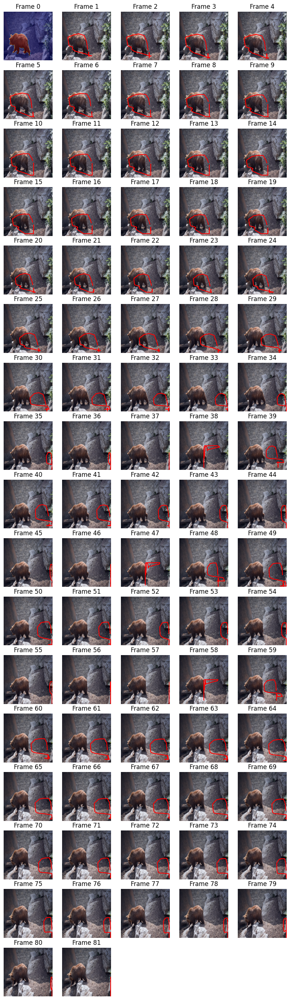

In [50]:
tmp_infer.show_infer_results(0, interval=1)

In [51]:
(
    video_idx,
    frame_idx,
    fir_img,
    fir_sgm,
    pre_img,
    pre_sgm,
    cur_img,
    cur_sgm,
) = next(iter(tmp_loader))

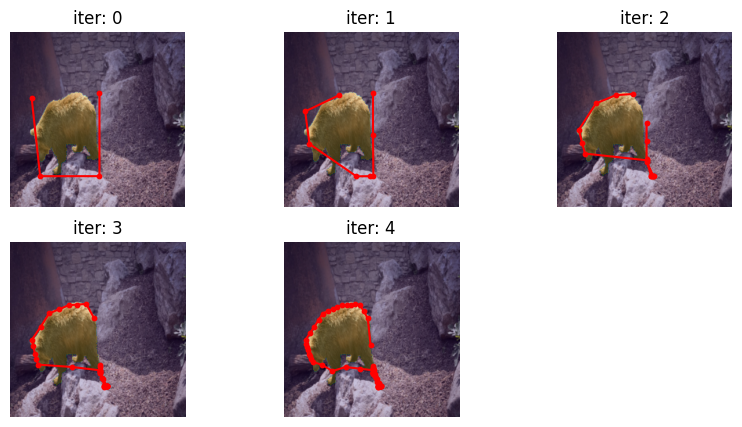

In [59]:
index = 0
up_model.train()
results = up_model(
    fir_img.cuda(),
    fir_sgm.cuda(),
    pre_img.cuda(),
    pre_sgm.cuda(),
    cur_img.cuda(),
)
plt.figure(figsize=(10, 5))
# plt.title("input with ground truth")
one_line_object_num = 3
line_num = len(results) // one_line_object_num + 1
for i in range(len(results)):
    plt.subplot(line_num, one_line_object_num, i + 1)
    plt.axis("off")
    plt.imshow(normalize(cur_img[index].permute(1, 2, 0)))
    plt.imshow(cur_sgm[index], alpha=0.2)
    plt.scatter(results[i][index][:, 0].cpu().detach().numpy(), results[i][index][:, 1].cpu().detach().numpy(), c="r", s=10)
    plt.plot(results[i][index][:, 0].cpu().detach().numpy(), results[i][index][:, 1].cpu().detach().numpy(), c="r")
    plt.title(f"iter: {i}")


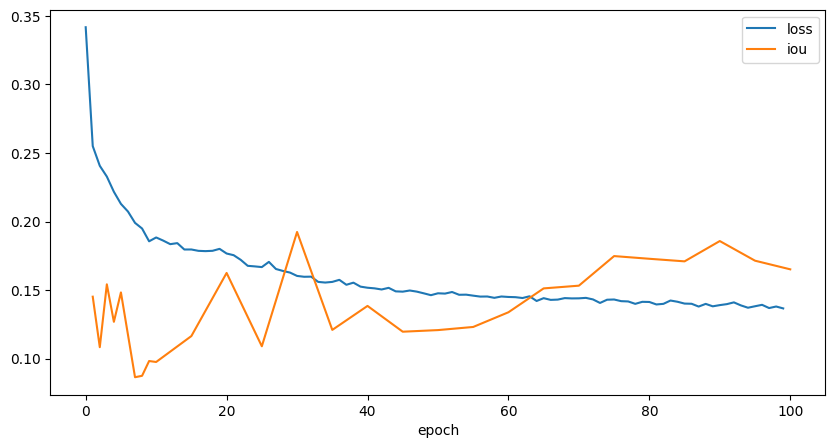

In [53]:
# plot the up loss curve
plt.figure(figsize=(10, 5))
plt.plot(list(up_loss_dict.keys()), list(up_loss_dict.values()), label="loss")
# plot the up iou curve
plt.plot(list(iou_dict.keys()), list(iou_dict.values()), label="iou")
plt.xlabel("epoch")
plt.legend()
plt.show()